In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
np.random.seed(42)

In [3]:
def generate_normal_samples(mean, std_dev, num_samples, num_dimensions):
    """
    Generate normal samples in an n-dimensional space.

    Parameters:
    - mean: Mean of the normal distribution.
    - std_dev: Standard deviation of the normal distribution.
    - num_samples: Number of samples to generate.
    - num_dimensions: Number of dimensions in the sample space.

    Returns:
    - samples: NumPy array containing the generated samples.
    """
    samples = np.random.normal(mean, std_dev, size=(num_samples, num_dimensions))
    return samples

def generate_random_binary_vector(length):
    """
    Generate a random binary vector (0,1) of a given length. With at least one guaranteed 1

    Parameters:
    - length: Length of the binary vector.

    Returns:
    - binary_vector: NumPy array containing the generated binary vector.
    """
    binary_vector = np.random.randint(2, size=length)
    binary_vector[np.random.randint(length)] = 1
    return binary_vector

# Example usage:
mean_value = 0.0
std_deviation = 1.0
num_samples_to_generate = 10000
num_dimensions = 2

samples = generate_normal_samples(mean_value, std_deviation, num_samples_to_generate, num_dimensions)

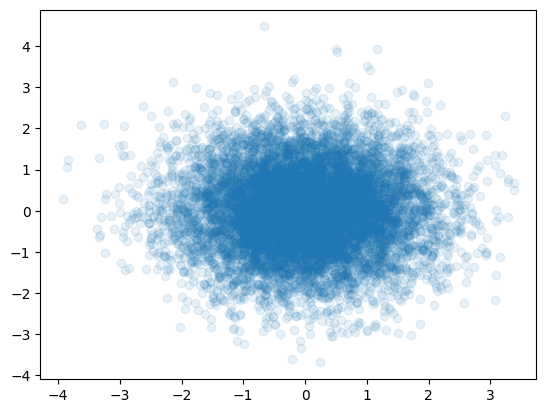

In [4]:
plt.scatter(samples[:,0], samples[:,1], alpha=0.1)

In [5]:
starting_samples = 100000
num_dimensions = 2

In [6]:
samples = generate_normal_samples(mean_value, std_deviation, starting_samples, num_dimensions)

In [7]:
sliding = []
for i in range(50):
    sliding.append(generate_normal_samples(mean_value, std_deviation, starting_samples//50, num_dimensions)+0.2*i)
sliding = np.vstack(sliding)

In [8]:
sliding

array([[-1.25263126, -0.76666017],
       [ 0.08682905, -0.0749214 ],
       [ 0.46324541,  0.41160642],
       ...,
       [11.23455102,  8.58885811],
       [ 8.58811553, 10.75303276],
       [ 9.32330564,  8.05241774]])

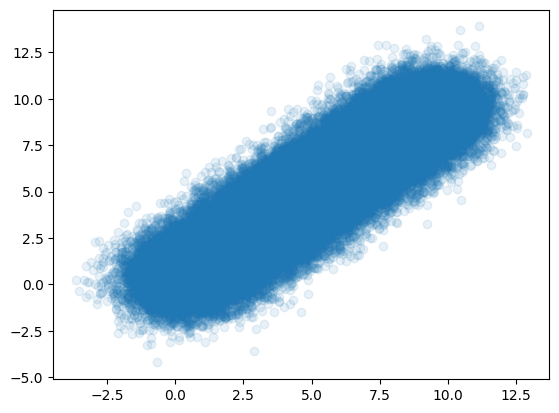

In [9]:
plt.scatter(sliding[:,0], sliding[:,1], alpha=0.1)

In [10]:
jump_back = generate_normal_samples(mean_value, std_deviation, starting_samples, num_dimensions)

In [11]:
jump_to_new_place = generate_normal_samples(mean_value, std_deviation, starting_samples, num_dimensions) + generate_random_binary_vector(num_dimensions)*15

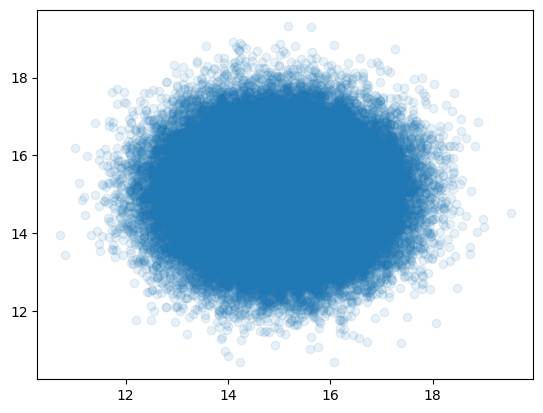

In [12]:
plt.scatter(jump_to_new_place[:,0], jump_to_new_place[:,1], alpha=0.1)

In [13]:
jump_back_and_forth = []
r_vec = generate_random_binary_vector(num_dimensions)
for i in range(10):
    jump_back_and_forth.append(generate_normal_samples(mean_value, std_deviation, starting_samples//10, num_dimensions) + r_vec*(15+(i%2)*8))
    
jump_back_and_forth = np.vstack(jump_back_and_forth)

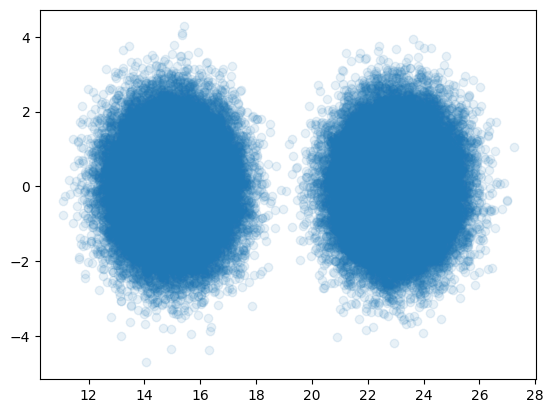

In [14]:
plt.scatter(jump_back_and_forth[:,0], jump_back_and_forth[:,1], alpha=0.1)

In [15]:
dev_smaller_than_larger = []
    
for i in range(50):
    dev_smaller_than_larger.append(generate_normal_samples(mean_value, (std_deviation/50)*(50-i), starting_samples//50, num_dimensions))

for i in range(50):
    dev_smaller_than_larger.append(generate_normal_samples(mean_value, (std_deviation/50)*(i+1), starting_samples//50, num_dimensions))
                                   
dev_smaller_than_larger = np.vstack(dev_smaller_than_larger)

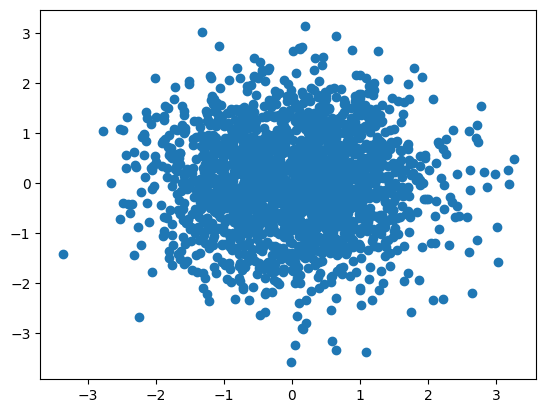

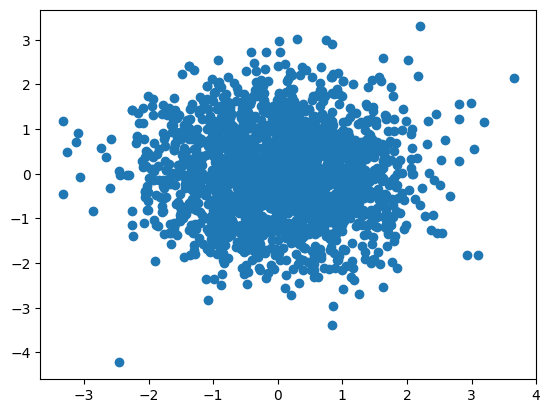

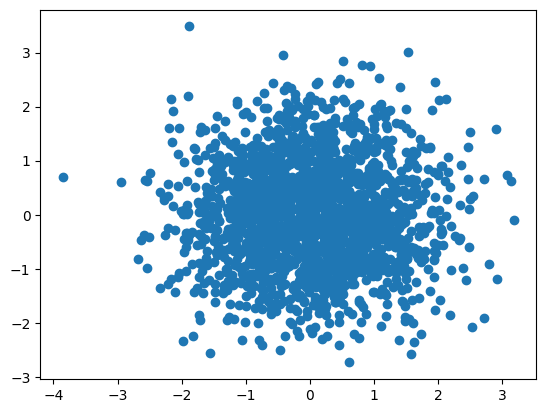

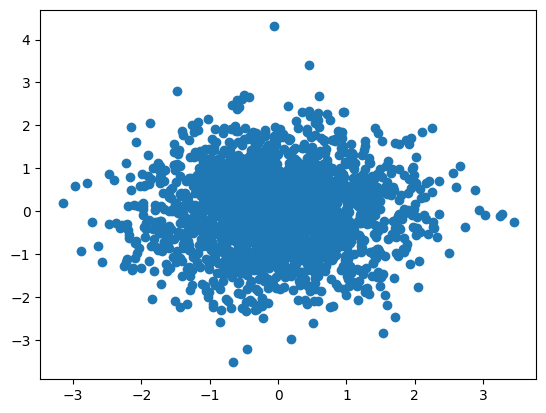

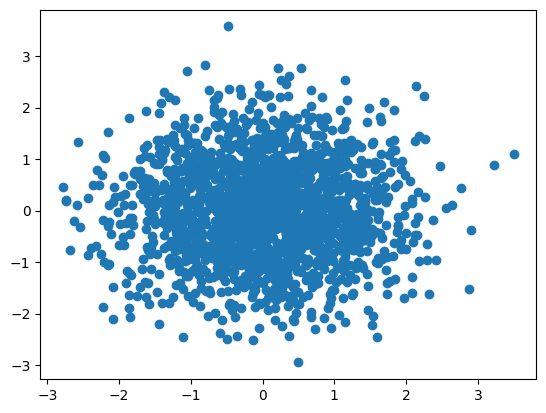

...

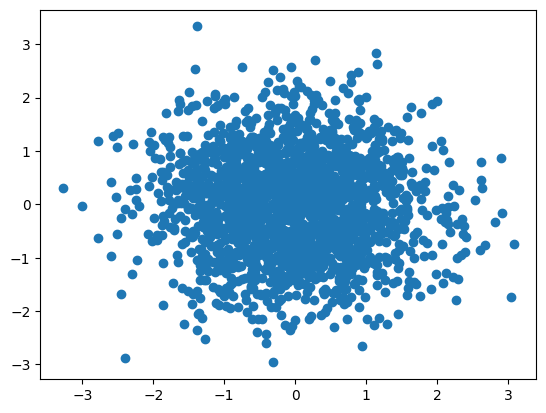

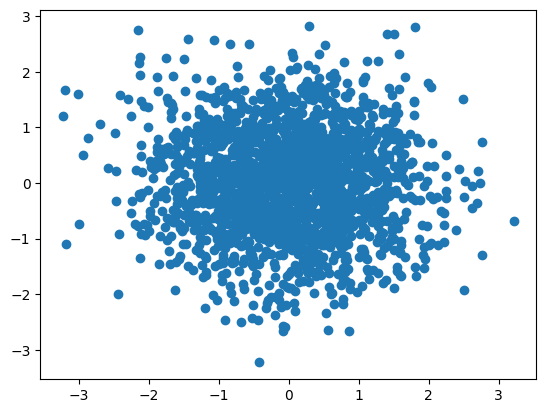

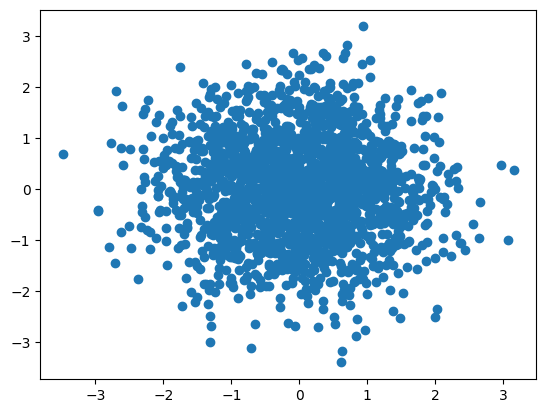

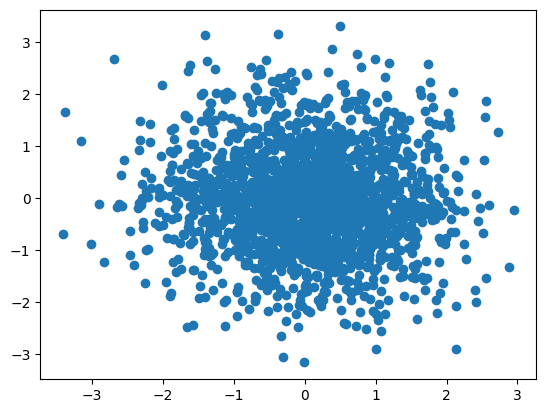

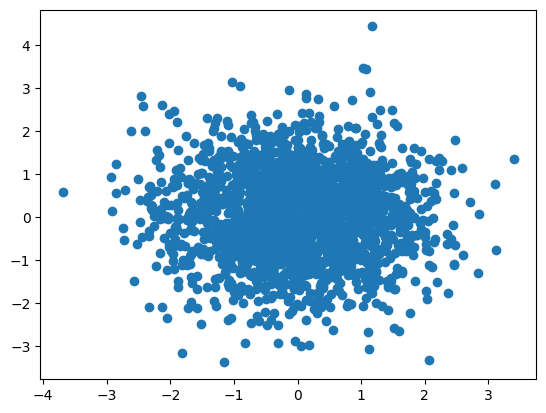

In [16]:
for i in range(100):
    plt.scatter(dev_smaller_than_larger[dev_smaller_than_larger.shape[0]//100*i:dev_smaller_than_larger.shape[0]//100*(i+1),0], dev_smaller_than_larger[dev_smaller_than_larger.shape[0]//100*i:dev_smaller_than_larger.shape[0]//100*(i+1),1])
    plt.show()

In [17]:
s = np.vstack([samples, sliding, jump_back, jump_to_new_place, jump_back_and_forth, dev_smaller_than_larger])

In [18]:
s.shape

(700000, 2)

In [22]:
700000/2000

350.0

In [20]:
starting_samples//50

2000

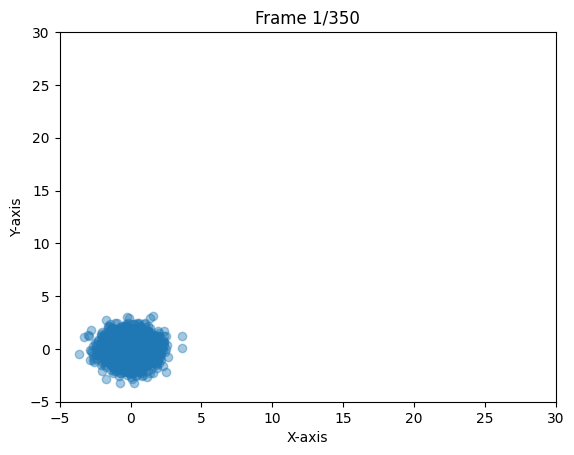

In [23]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Generate some random data for demonstration
np.random.seed(42)
num_frames = 350

# Function to update scatter plot in each frame
def update(frame):
    plt.clf()  # Clear the previous plot
    plt.xlim([-5, 30])  # Adjust these values as needed
    plt.ylim([-5, 30])
    plt.scatter(s[frame*2000:(frame+1)*2000, 0], s[frame*2000:(frame+1)*2000, 1], alpha=0.4)
    plt.title(f"Frame {frame+1}/{num_frames}")
    plt.xlabel("X-axis")
    plt.ylabel("Y-axis")

fig, ax = plt.subplots()
animation = FuncAnimation(fig, update, frames=num_frames, interval=200, repeat=True)

HTML(animation.to_jshtml())

In [150]:
np.save("data.npy", s)

In [151]:
s==np.load("data.npy")

array([[ True,  True],
       [ True,  True],
       [ True,  True],
       ...,
       [ True,  True],
       [ True,  True],
       [ True,  True]])

In [152]:
mean_value = 0.0
std_deviation = 1.0
starting_samples = 100000
num_dimensions = 10

def data_gen():
    samples = generate_normal_samples(mean_value, std_deviation, starting_samples, num_dimensions)
    
    sliding = []
    for i in range(50):
        sliding.append(generate_normal_samples(mean_value, std_deviation, starting_samples//50, num_dimensions)+0.2*i)
    sliding = np.vstack(sliding)
    
    jump_back = generate_normal_samples(mean_value, std_deviation, starting_samples, num_dimensions)
    
    jump_to_new_place = generate_normal_samples(mean_value, std_deviation, starting_samples, num_dimensions) + generate_random_binary_vector(num_dimensions)*15
    
    jump_back_and_forth = []
    r_vec = generate_random_binary_vector(num_dimensions)
    for i in range(10):
        jump_back_and_forth.append(generate_normal_samples(mean_value, std_deviation, starting_samples//10, num_dimensions) + r_vec*(15+(i%2)*8))

    jump_back_and_forth = np.vstack(jump_back_and_forth)
    
    
    dev_smaller_than_larger = []
    
    for i in range(50):
        dev_smaller_than_larger.append(generate_normal_samples(mean_value, (std_deviation/50)*(50-i), starting_samples//50, num_dimensions))

    for i in range(50):
        dev_smaller_than_larger.append(generate_normal_samples(mean_value, (std_deviation/50)*(i+1), starting_samples//50, num_dimensions))

    dev_smaller_than_larger = np.vstack(dev_smaller_than_larger)
    
    s = np.vstack([samples, sliding, jump_back, jump_to_new_place, jump_back_and_forth, dev_smaller_than_larger])
    
    return s

In [153]:
d = data_gen()

In [155]:
np.save("data.npy", d)

In [24]:
import scipy.io

# Load the .mat file
mat_data = scipy.io.loadmat('./Volumes/Seagate/seizure_detection/competition_data/clips/Patient_1/Patient_1_ictal_segment_1.mat')

# Access data from the dictionary
# For example, if the MATLAB file contains a variable named 'data', you can access it like this:
data = mat_data['data']

In [25]:
data.shape

(68, 500)

In [26]:
data

array([[ 204.984,  213.984,  217.984, ..., -195.016, -216.016, -214.016],
       [-138.314, -127.314, -111.314, ...,   17.686,  -17.314,  -40.314],
       [ -64.03 ,  -57.03 ,  -28.03 , ...,  -55.03 ,  -83.03 ,  -66.03 ],
       ...,
       [-281.344, -261.344, -232.344, ...,   90.656,   97.656,  112.656],
       [  70.398,   99.398,  117.398, ...,  -58.602,  -44.602,   -1.602],
       [-112.468, -116.468, -123.468, ..., -142.468, -147.468, -139.468]])

In [1]:
import numpy as np

In [3]:
np.load('data.npy').shape

(700000, 10)